In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

In [4]:
import os
import PIL
import cv2
import imageio
import matplotlib.pyplot as plt
import numpy as np
import time

from IPython import display

In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip celeba-dataset.zip

In [ ]:
!pip insatll imageio
!pip install git+https://github.com/tensorflow/docs

In [28]:
data_dir = '/content/img_align_celeba/'

In [ ]:
import pandas as pd

list_eval_partition = pd.read_csv('/content/list_eval_partition.csv')
names_df = list_eval_partition['image_id']
names_df.head()

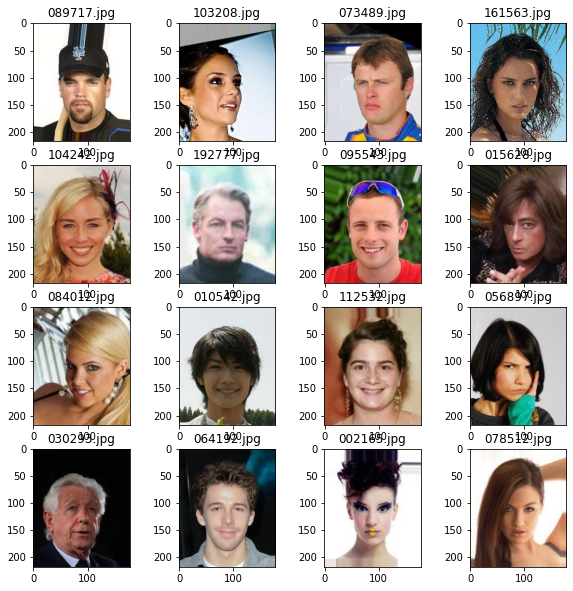

In [29]:
img_names = names_df.sample(n=16).values

plt.figure(figsize=(10,10))
for i, name in enumerate(img_names):
    plt.subplot(4, 4, i + 1)
    img = plt.imread(data_dir +'img_align_celeba/' + name)
    plt.imshow(img)
    plt.title(name)

In [ ]:
data_path = '/content/img_align_celeba/img_align_celeba'
images = [] 

for image in(os.listdir(data_path)[:50000]):
  img = cv2.imread(os.path.join(data_path, image))
  img = cv2.resize(img,(64,64))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  images.append(img)

In [10]:
images = np.array(images)
train_images = images.reshape(images.shape[0], 64, 64, 3).astype('float32')
train_images = (train_images - 127.5) / 127.5  

In [11]:
BUFFER_SIZE = 10000
BATCH_SIZE = 256

In [12]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [13]:
def make_generator():
generator_model = tf.keras.Sequential()
    generator_model.add(layers.Dense(8*8*128, use_bias=False, input_shape=(100,)))
    generator_model.add(layers.BatchNormalization())
    generator_model.add(layers.LeakyReLU())

    generator_model.add(layers.Reshape((8, 8, 128)))
    assert generator_model.output_shape == (None, 8, 8, 128)  

    generator_model.add(layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert generator_model.output_shape == (None, 8, 8, 64)
    generator_model.add(layers.BatchNormalization())
    generator_model.add(layers.LeakyReLU())

    generator_model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert generator_model.output_shape == (None, 16, 16, 32)
    generator_model.add(layers.BatchNormalization())
    generator_model.add(layers.LeakyReLU())

    generator_model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert generator_model.output_shape == (None, 32, 32, 32)
    generator_model.add(layers.BatchNormalization())
    generator_model.add(layers.LeakyReLU())

    generator_model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert generator_model.output_shape == (None, 64, 64, 3)

    return generator_model

In [ ]:
make_generator()

In [14]:

def make_discriminator():
    discriminator_model= tf.keras.Sequential()
    discriminator_model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',input_shape=[64, 64, 3]))
    discriminator_model.add(layers.LeakyReLU())
    discriminator_model.add(layers.Dropout(0.3))

    discriminator_model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    discriminator_model.add(layers.LeakyReLU())
    discriminator_model.add(layers.Dropout(0.3))

    discriminator_model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    discriminator_model.add(layers.LeakyReLU())
    discriminator_model.add(layers.Dropout(0.3))

    discriminator_model.add(layers.Flatten())
    discriminator_model.add(layers.Dense(1))

    return discriminator_model

In [ ]:
make_discriminator()

In [15]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [16]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [17]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [18]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [19]:
EPOCHS = 100
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [20]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator_model,
                                 discriminator=discriminator_model)

In [21]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator_model(noise, training=True)

      real_output = discriminator_model(images, training=True)
      fake_output = discriminator_model(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator_model.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_model.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator_model.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator_model.trainable_variables))

In [22]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in (dataset):
      train_step(image_batch)


    display.clear_output(wait=True)
    generate_and_save_images(generator_model,epoch + 1,seed)

    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  display.clear_output(wait=True)
  generate_and_save_images(generator_model,
                           epochs,
                           seed)

In [23]:
def generate_and_save_images(model, epoch, test_input):
 
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(6, 6))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow((np.array(predictions[i, :, :, :] * 127.5 ) + 127.5 ).astype('uint8'))
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

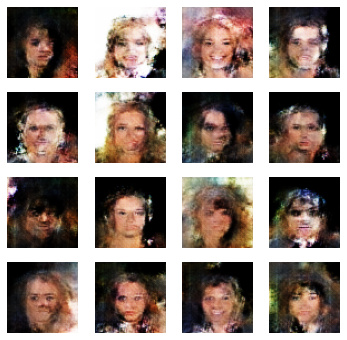

In [24]:
train(train_dataset, EPOCHS)

In [25]:
anim_file ='celeba_gan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


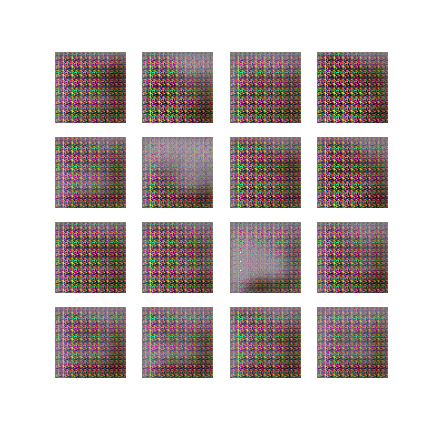

In [26]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)